# Cleaning and Analysis Project

In this project we will work with exit surveys from employees of the Department of Education, Training and Employment (DETE) and the Technical and Further Education (TAFE) institute in Queensland, Australia.

The first goal will be to determine if most of the resigns for dissatisfaction were from employees with few years worked in the institution, or if was from employees with several years worked.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline

In [2]:
dete_survey = pd.read_csv("dete_survey.csv", na_values="Not Stated")
tafe_survey = pd.read_csv("tafe_survey.csv")

pd.set_option("max_columns", None) 
pd.set_option("max_rows", None)

In [3]:
dete_survey.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 822 entries, 0 to 821
Data columns (total 56 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   ID                                   822 non-null    int64  
 1   SeparationType                       822 non-null    object 
 2   Cease Date                           788 non-null    object 
 3   DETE Start Date                      749 non-null    float64
 4   Role Start Date                      724 non-null    float64
 5   Position                             817 non-null    object 
 6   Classification                       455 non-null    object 
 7   Region                               717 non-null    object 
 8   Business Unit                        126 non-null    object 
 9   Employment Status                    817 non-null    object 
 10  Career move to public sector         822 non-null    bool   
 11  Career move to private sector   

In [4]:
tafe_survey.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 702 entries, 0 to 701
Data columns (total 72 columns):
 #   Column                                                                                                                                                         Non-Null Count  Dtype  
---  ------                                                                                                                                                         --------------  -----  
 0   Record ID                                                                                                                                                      702 non-null    float64
 1   Institute                                                                                                                                                      702 non-null    object 
 2   WorkArea                                                                                                                                  

In [5]:
dete_survey.head()

,ID,SeparationType,Cease Date,DETE Start Date,Role Start Date,Position,Classification,Region,Business Unit,Employment Status,Career move to public sector,Career move to private sector,Interpersonal conflicts,Job dissatisfaction,Dissatisfaction with the department,Physical work environment,Lack of recognition,Lack of job security,Work location,Employment conditions,Maternity/family,Relocation,Study/Travel,Ill Health,Traumatic incident,Work life balance,Workload,None of the above,Professional Development,Opportunities for promotion,Staff morale,Workplace issue,Physical environment,Worklife balance,Stress and pressure support,Performance of supervisor,Peer support,Initiative,Skills,Coach,Career Aspirations,Feedback,Further PD,Communication,My say,Information,Kept informed,Wellness programs,Health & Safety,Gender,Age,Aboriginal,Torres Strait,South Sea,Disability,NESB
0,1,Ill Health Retirement,08/2012,1984.0,2004.0,Public Servant,A01-A04,Central Office,Corporate Strategy and Peformance,Permanent Full-time,True,False,False,True,False,False,True,False,False,False,False,False,False,False,False,False,False,True,A,A,N,N,N,A,A,A,A,N,N,N,A,A,A,N,A,A,N,N,N,Male,56-60,NaN,NaN,NaN,NaN,Yes
1,2,Voluntary Early Retirement (VER),08/2012,NaN,NaN,Public Servant,AO5-AO7,Central Office,Corporate Strategy and Peformance,Permanent Full-time,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,A,A,N,N,N,N,A,A,A,N,N,N,A,A,A,N,A,A,N,N,N,Male,56-60,NaN,NaN,NaN,NaN,NaN
2,3,Voluntary Early Retirement (VER),05/2012,2011.0,2011.0,Schools Officer,NaN,Central Office,Education Queensland,Permanent Full-time,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,N,N,N,N,N,N,N,N,N,N,N,N,N,N,N,A,A,N,N,N,N,Male,61 or older,NaN,NaN,NaN,NaN,NaN
3,4,Resignation-Other reasons,05/2012,2005.0,2006.0,Teacher,Primary,Central Queensland,NaN,Permanent Full-time,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,A,N,N,N,A,A,N,N,A,A,A,A,A,A,A,A,A,A,A,N,A,Female,36-40,NaN,NaN,NaN,NaN,NaN
4,5,Age Retirement,05/2012,1970.0,1989.0,Head of Curriculum/Head of Special Education,NaN,South East,NaN,Permanent Full-time,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,A,A,N,N,D,D,N,A,A,A,A,A,A,SA,SA,D,D,A,N,A,M,Female,61 or older,NaN,NaN,NaN,NaN,NaN


In [6]:
tafe_survey.head()

,Record ID,Institute,WorkArea,CESSATION YEAR,Reason for ceasing employment,Contributing Factors. Career Move - Public Sector,Contributing Factors. Career Move - Private Sector,Contributing Factors. Career Move - Self-employment,Contributing Factors. Ill Health,Contributing Factors. Maternity/Family,Contributing Factors. Dissatisfaction,Contributing Factors. Job Dissatisfaction,Contributing Factors. Interpersonal Conflict,Contributing Factors. Study,Contributing Factors. Travel,Contributing Factors. Other,Contributing Factors. NONE,Main Factor. Which of these was the main factor for leaving?,InstituteViews. Topic:1. I feel the senior leadership had a clear vision and direction,InstituteViews. Topic:2. I was given access to skills training to help me do my job better,InstituteViews. Topic:3. I was given adequate opportunities for personal development,InstituteViews. Topic:4. I was given adequate opportunities for promotion within %Institute]Q25LBL%,InstituteViews. Topic:5. I felt the salary for the job was right for the responsibilities I had,InstituteViews. Topic:6. The organisation recognised when staff did good work,InstituteViews. Topic:7. Management was generally supportive of me,InstituteViews. Topic:8. Management was generally supportive of my team,InstituteViews. Topic:9. I was kept informed of the changes in the organisation which would affect me,InstituteViews. Topic:10. Staff morale was positive within the Institute,InstituteViews. Topic:11. If I had a workplace issue it was dealt with quickly,InstituteViews. Topic:12. If I had a workplace issue it was dealt with efficiently,InstituteViews. Topic:13. If I had a workplace issue it was dealt with discreetly,WorkUnitViews. Topic:14. I was satisfied with the quality of the management and supervision within my work unit,WorkUnitViews. Topic:15. I worked well with my colleagues,WorkUnitViews. Topic:16. My job was challenging and interesting,WorkUnitViews. Topic:17. I was encouraged to use my initiative in the course of my work,WorkUnitViews. Topic:18. I had sufficient contact with other people in my job,WorkUnitViews. Topic:19. I was given adequate support and co-operation by my peers to enable me to do my job,WorkUnitViews. Topic:20. I was able to use the full range of my skills in my job,WorkUnitViews. Topic:21. I was able to use the full range of my abilities in my job. ; Category:Level of Agreement; Question:YOUR VIEWS ABOUT YOUR WORK UNIT],WorkUnitViews. Topic:22. I was able to use the full range of my knowledge in my job,WorkUnitViews. Topic:23. My job provided sufficient variety,WorkUnitViews. Topic:24. I was able to cope with the level of stress and pressure in my job,WorkUnitViews. Topic:25. My job allowed me to balance the demands of work and family to my satisfaction,WorkUnitViews. Topic:26. My supervisor gave me adequate personal recognition and feedback on my performance,"WorkUnitViews. Topic:27. My working environment was satisfactory e.g. sufficient space, good lighting, suitable seating and working area",WorkUnitViews. Topic:28. I was given the opportunity to mentor and coach others in order for me to pass on my skills and knowledge prior to my cessation date,WorkUnitViews. Topic:29. There was adequate communication between staff in my unit,WorkUnitViews. Topic:30. Staff morale was positive within my work unit,Induction. Did you undertake Workplace Induction?,InductionInfo. Topic:Did you undertake a Corporate Induction?,InductionInfo. Topic:Did you undertake a Institute Induction?,InductionInfo. Topic: Did you undertake Team Induction?,InductionInfo. Face to Face Topic:Did you undertake a Corporate Induction; Category:How it was conducted?,InductionInfo. On-line Topic:Did you undertake a Corporate Induction; Category:How it was conducted?,InductionInfo. Induction Manual Topic:Did you undertake a Corporate Induction?,InductionInfo. Face to Face Topic:Did you undertake a Institute Induction?,InductionInfo. On-line Topic:Did you undertake a Institute Induction?

In [7]:
dete_survey.isnull().sum()

ID                                       0
SeparationType                           0
Cease Date                              34
DETE Start Date                         73
Role Start Date                         98
Position                                 5
Classification                         367
Region                                 105
Business Unit                          696
Employment Status                        5
Career move to public sector             0
Career move to private sector            0
Interpersonal conflicts                  0
Job dissatisfaction                      0
Dissatisfaction with the department      0
Physical work environment                0
Lack of recognition                      0
Lack of job security                     0
Work location                            0
Employment conditions                    0
Maternity/family                         0
Relocation                               0
Study/Travel                             0
Ill Health 

In [8]:
tafe_survey.isnull().sum()

Record ID                                                                                                                                                          0
Institute                                                                                                                                                          0
WorkArea                                                                                                                                                           0
CESSATION YEAR                                                                                                                                                     7
Reason for ceasing employment                                                                                                                                      1
Contributing Factors. Career Move - Public Sector                                                                                                                265
Contributi

As we can see, the dete_survey have more entries than the tafe_survey, and the tafe_survey have more columns.

Both datasets have null values. Some columns more than others. In fact, some columns have mostly null values.

In [9]:
dete_survey_updated = dete_survey.drop(dete_survey.columns[28:49], axis=1)
tafe_survey_updated = tafe_survey.drop(tafe_survey.columns[17:66], axis=1)

Since our goal is to determine the reason the employees resigned, we will eliminate the columns related to reviews or other information not related to the reasons of resign of each employee.

In [10]:
tafe_survey_updated = tafe_survey.rename(columns={"Record ID": "id", "CESSATION YEAR": "cease_date", 
                                                          "Reason for ceasing employment": "separationtype", 
                                                          "Gender. What is your Gender?": "gender", 
                                                          "CurrentAge. Current Age": "age", 
                                                          "Employment Type. Employment Type": "employment_status", 
                                                          "Classification. Classification": "position", 
                                                          "LengthofServiceOverall. Overall Length of Service at Institute (in years)": "institute_service", 
                                                          "LenghtofServiceCurrent. Length of Service at current workplace (in years)": "role_service"})

Before standarizing the column names of both datasets, we changed some columns names in the tafe_survey to match the column names in the dete_survey that have the same kind of information.

In [11]:
dete_survey_updated.columns = dete_survey_updated.columns.str.replace(".", "").str.replace("\s+", " ").str.strip().str.replace(" ", "_").str.lower()
tafe_survey_updated.columns = tafe_survey_updated.columns.str.replace(".", "").str.replace("\s+", " ").str.strip().str.replace(" ", "_").str.lower()

Here we will start by standarizing the columns of both datasets, so that it becomes easier to deal with them in case we merge them into one single dataset. Also it help to facilitate the reading.

In [12]:
dete_survey_updated.head()

,id,separationtype,cease_date,dete_start_date,role_start_date,position,classification,region,business_unit,employment_status,career_move_to_public_sector,career_move_to_private_sector,interpersonal_conflicts,job_dissatisfaction,dissatisfaction_with_the_department,physical_work_environment,lack_of_recognition,lack_of_job_security,work_location,employment_conditions,maternity/family,relocation,study/travel,ill_health,traumatic_incident,work_life_balance,workload,none_of_the_above,gender,age,aboriginal,torres_strait,south_sea,disability,nesb
0,1,Ill Health Retirement,08/2012,1984.0,2004.0,Public Servant,A01-A04,Central Office,Corporate Strategy and Peformance,Permanent Full-time,True,False,False,True,False,False,True,False,False,False,False,False,False,False,False,False,False,True,Male,56-60,NaN,NaN,NaN,NaN,Yes
1,2,Voluntary Early Retirement (VER),08/2012,NaN,NaN,Public Servant,AO5-AO7,Central Office,Corporate Strategy and Peformance,Permanent Full-time,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,Male,56-60,NaN,NaN,NaN,NaN,NaN
2,3,Voluntary Early Retirement (VER),05/2012,2011.0,2011.0,Schools Officer,NaN,Central Office,Education Queensland,Permanent Full-time,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,Male,61 or older,NaN,NaN,NaN,NaN,NaN
3,4,Resignation-Other reasons,05/2012,2005.0,2006.0,Teacher,Primary,Central Queensland,NaN,Permanent Full-time,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,Female,36-40,NaN,NaN,NaN,NaN,NaN
4,5,Age Retirement,05/2012,1970.0,1989.0,Head of Curriculum/Head of Special Education,NaN,South East,NaN,Permanent Full-time,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,Female,61 or older,NaN,NaN,NaN,NaN,NaN


In [13]:
tafe_survey_updated.head()

,id,institute,workarea,cease_date,separationtype,contributing_factors_career_move_-_public_sector,contributing_factors_career_move_-_private_sector,contributing_factors_career_move_-_self-employment,contributing_factors_ill_health,contributing_factors_maternity/family,contributing_factors_dissatisfaction,contributing_factors_job_dissatisfaction,contributing_factors_interpersonal_conflict,contributing_factors_study,contributing_factors_travel,contributing_factors_other,contributing_factors_none,main_factor_which_of_these_was_the_main_factor_for_leaving?,instituteviews_topic:1_i_feel_the_senior_leadership_had_a_clear_vision_and_direction,instituteviews_topic:2_i_was_given_access_to_skills_training_to_help_me_do_my_job_better,instituteviews_topic:3_i_was_given_adequate_opportunities_for_personal_development,instituteviews_topic:4_i_was_given_adequate_opportunities_for_promotion_within_%institute]q25lbl%,instituteviews_topic:5_i_felt_the_salary_for_the_job_was_right_for_the_responsibilities_i_had,instituteviews_topic:6_the_organisation_recognised_when_staff_did_good_work,instituteviews_topic:7_management_was_generally_supportive_of_me,instituteviews_topic:8_management_was_generally_supportive_of_my_team,instituteviews_topic:9_i_was_kept_informed_of_the_changes_in_the_organisation_which_would_affect_me,instituteviews_topic:10_staff_morale_was_positive_within_the_institute,instituteviews_topic:11_if_i_had_a_workplace_issue_it_was_dealt_with_quickly,instituteviews_topic:12_if_i_had_a_workplace_issue_it_was_dealt_with_efficiently,instituteviews_topic:13_if_i_had_a_workplace_issue_it_was_dealt_with_discreetly,workunitviews_topic:14_i_was_satisfied_with_the_quality_of_the_management_and_supervision_within_my_work_unit,workunitviews_topic:15_i_worked_well_with_my_colleagues,workunitviews_topic:16_my_job_was_challenging_and_interesting,workunitviews_topic:17_i_was_encouraged_to_use_my_initiative_in_the_course_of_my_work,workunitviews_topic:18_i_had_sufficient_contact_with_other_people_in_my_job,workunitviews_topic:19_i_was_given_adequate_support_and_co-operation_by_my_peers_to_enable_me_to_do_my_job,workunitviews_topic:20_i_was_able_to_use_the_full_range_of_my_skills_in_my_job,workunitviews_topic:21_i_was_able_to_use_the_full_range_of_my_abilities_in_my_job_;_category:level_of_agreement;_question:your_views_about_your_work_unit],workunitviews_topic:22_i_was_able_to_use_the_full_range_of_my_knowledge_in_my_job,workunitviews_topic:23_my_job_provided_sufficient_variety,workunitviews_topic:24_i_was_able_to_cope_with_the_level_of_stress_and_pressure_in_my_job,workunitviews_topic:25_my_job_allowed_me_to_balance_the_demands_of_work_and_family_to_my_satisfaction,workunitviews_topic:26_my_supervisor_gave_me_adequate_personal_recognition_and_feedback_on_my_performance,"workunitviews_topic:27_my_working_environment_was_satisfactory_eg_sufficient_space,_good_lighting,_suitable_seating_and_working_area",workunitviews_topic:28_i_was_given_the_opportunity_to_mentor_and_coach_others_in_order_for_me_to_pass_on_my_skills_and_knowledge_prior_to_my_cessation_date,workunitviews_topic:29_there_was_adequate_communication_between_staff_in_my_unit,workunitviews_topic:30_staff_morale_was_positive_within_my_work_unit,induction_did_you_undertake_workplace_induction?,inductioninfo_topic:did_you_undertake_a_corporate_induction?,inductioninfo_topic:did_you_undertake_a_institute_induction?,inductioninfo_topic:_did_you_undertake_team_induction?,inductioninfo_face_to_face_topic:did_you_undertake_a_corporate_induction;_category:how_it_was_conducted?,inductioninfo_on-line_topic:did_you_undertake_a_corporate_induction;_category:how_it_was_conducted?,inductioninfo_induction_manual_topic:did_you_undertake_a_corporate_induction?,inductioninfo_face_to_face_topic:did_you_undertake_a_institute_induction?,inductioninfo_on-line_topic:did_you_undertake_a_institute_induction?,inductioninfo_induction_manual_topic:did_you_undertake_a_institute_induction?,inductioninfo_face_to_face_topic

Now is easier to read the column names and some columns from both datset now also matches names.

In [14]:
dete_survey_updated["separationtype"].value_counts()

Age Retirement                          285
Resignation-Other reasons               150
Resignation-Other employer               91
Resignation-Move overseas/interstate     70
Voluntary Early Retirement (VER)         67
Ill Health Retirement                    61
Other                                    49
Contract Expired                         34
Termination                              15
Name: separationtype, dtype: int64

In [15]:
tafe_survey_updated["separationtype"].value_counts()

Resignation                 340
Contract Expired            127
Retrenchment/ Redundancy    104
Retirement                   82
Transfer                     25
Termination                  23
Name: separationtype, dtype: int64

In [16]:
dete_resignations = dete_survey_updated[dete_survey_updated["separationtype"].str.contains(r"Resignation", na=False)].copy()

tafe_resignations = tafe_survey_updated[tafe_survey_updated["separationtype"].copy().str.contains(r"Resignation", na=False)].copy()

In [17]:
dete_resignations

,id,separationtype,cease_date,dete_start_date,role_start_date,position,classification,region,business_unit,employment_status,career_move_to_public_sector,career_move_to_private_sector,interpersonal_conflicts,job_dissatisfaction,dissatisfaction_with_the_department,physical_work_environment,lack_of_recognition,lack_of_job_security,work_location,employment_conditions,maternity/family,relocation,study/travel,ill_health,traumatic_incident,work_life_balance,workload,none_of_the_above,gender,age,aboriginal,torres_strait,south_sea,disability,nesb
3,4,Resignation-Other reasons,05/2012,2005.0,2006.0,Teacher,Primary,Central Queensland,NaN,Permanent Full-time,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,Female,36-40,NaN,NaN,NaN,NaN,NaN
5,6,Resignation-Other reasons,05/2012,1994.0,1997.0,Guidance Officer,NaN,Central Office,Education Queensland,Permanent Full-time,False,True,False,False,False,False,False,False,False,True,True,False,False,False,False,False,False,False,Female,41-45,NaN,NaN,NaN,NaN,NaN
8,9,Resignation-Other reasons,07/2012,2009.0,2009.0,Teacher,Secondary,North Queensland,NaN,Permanent Full-time,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,Female,31-35,NaN,NaN,NaN,NaN,NaN
9,10,Resignation-Other employer,2012,1997.0,2008.0,Teacher Aide,NaN,NaN,NaN,Permanent Part-time,False,False,True,True,True,False,False,False,False,False,False,False,False,False,False,False,False,False,Female,46-50,NaN,NaN,NaN,NaN,NaN
11,12,Resignation-Move overseas/interstate,2012,2009.0,2009.0,Teacher,Secondary,Far North Queensland,NaN,Permanent Full-time,False,False,False,False,False,False,False,False,False,False,True,True,False,False,False,False,False,False,Male,31-35,NaN,NaN,NaN,NaN,NaN
12,13,Resignation-Other reasons,2012,1998.0,1998.0,Teacher,Primary,Far North Queensland,NaN,Permanent Full-time,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,Female,36-40,NaN,NaN,NaN,NaN,NaN
14,15,Resignation-Other employer,2012,2007.0,2010.0,Teacher,Secondary,Central Queensland,NaN,Permanent Full-time,False,False,False,True,True,False,False,False,False,False,False,False,False,False,False,False,False,False,Male,31-35,NaN,NaN,NaN,NaN,NaN
16,17,Resignation-Other reasons,2012,NaN,NaN,Teacher Aide,NaN,South East,NaN,Permanent Part-time,False,False,False,False,False,False,True,False,False,False,False,True,False,False,False,False,False,False,Male,61 or older,NaN,NaN,NaN,NaN,NaN
20,21,Resignation-Other employer,2012,1982.0,1982.0,Teacher,Secondary,Central Queensland,NaN,Permanent Full-time,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,True,Male,56-60,NaN,NaN,NaN,NaN,NaN
21,22,Resignation-Other reasons,2012,1980.0,2009.0,Cleaner,NaN,Darling Downs South West,NaN,Permanent Part-time,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,Female,51-55,NaN,NaN,NaN,NaN,NaN


In [18]:
tafe_resignations

,id,institute,workarea,cease_date,separationtype,contributing_factors_career_move_-_public_sector,contributing_factors_career_move_-_private_sector,contributing_factors_career_move_-_self-employment,contributing_factors_ill_health,contributing_factors_maternity/family,contributing_factors_dissatisfaction,contributing_factors_job_dissatisfaction,contributing_factors_interpersonal_conflict,contributing_factors_study,contributing_factors_travel,contributing_factors_other,contributing_factors_none,main_factor_which_of_these_was_the_main_factor_for_leaving?,instituteviews_topic:1_i_feel_the_senior_leadership_had_a_clear_vision_and_direction,instituteviews_topic:2_i_was_given_access_to_skills_training_to_help_me_do_my_job_better,instituteviews_topic:3_i_was_given_adequate_opportunities_for_personal_development,instituteviews_topic:4_i_was_given_adequate_opportunities_for_promotion_within_%institute]q25lbl%,instituteviews_topic:5_i_felt_the_salary_for_the_job_was_right_for_the_responsibilities_i_had,instituteviews_topic:6_the_organisation_recognised_when_staff_did_good_work,instituteviews_topic:7_management_was_generally_supportive_of_me,instituteviews_topic:8_management_was_generally_supportive_of_my_team,instituteviews_topic:9_i_was_kept_informed_of_the_changes_in_the_organisation_which_would_affect_me,instituteviews_topic:10_staff_morale_was_positive_within_the_institute,instituteviews_topic:11_if_i_had_a_workplace_issue_it_was_dealt_with_quickly,instituteviews_topic:12_if_i_had_a_workplace_issue_it_was_dealt_with_efficiently,instituteviews_topic:13_if_i_had_a_workplace_issue_it_was_dealt_with_discreetly,workunitviews_topic:14_i_was_satisfied_with_the_quality_of_the_management_and_supervision_within_my_work_unit,workunitviews_topic:15_i_worked_well_with_my_colleagues,workunitviews_topic:16_my_job_was_challenging_and_interesting,workunitviews_topic:17_i_was_encouraged_to_use_my_initiative_in_the_course_of_my_work,workunitviews_topic:18_i_had_sufficient_contact_with_other_people_in_my_job,workunitviews_topic:19_i_was_given_adequate_support_and_co-operation_by_my_peers_to_enable_me_to_do_my_job,workunitviews_topic:20_i_was_able_to_use_the_full_range_of_my_skills_in_my_job,workunitviews_topic:21_i_was_able_to_use_the_full_range_of_my_abilities_in_my_job_;_category:level_of_agreement;_question:your_views_about_your_work_unit],workunitviews_topic:22_i_was_able_to_use_the_full_range_of_my_knowledge_in_my_job,workunitviews_topic:23_my_job_provided_sufficient_variety,workunitviews_topic:24_i_was_able_to_cope_with_the_level_of_stress_and_pressure_in_my_job,workunitviews_topic:25_my_job_allowed_me_to_balance_the_demands_of_work_and_family_to_my_satisfaction,workunitviews_topic:26_my_supervisor_gave_me_adequate_personal_recognition_and_feedback_on_my_performance,"workunitviews_topic:27_my_working_environment_was_satisfactory_eg_sufficient_space,_good_lighting,_suitable_seating_and_working_area",workunitviews_topic:28_i_was_given_the_opportunity_to_mentor_and_coach_others_in_order_for_me_to_pass_on_my_skills_and_knowledge_prior_to_my_cessation_date,workunitviews_topic:29_there_was_adequate_communication_between_staff_in_my_unit,workunitviews_topic:30_staff_morale_was_positive_within_my_work_unit,induction_did_you_undertake_workplace_induction?,inductioninfo_topic:did_you_undertake_a_corporate_induction?,inductioninfo_topic:did_you_undertake_a_institute_induction?,inductioninfo_topic:_did_you_undertake_team_induction?,inductioninfo_face_to_face_topic:did_you_undertake_a_corporate_induction;_category:how_it_was_conducted?,inductioninfo_on-line_topic:did_you_undertake_a_corporate_induction;_category:how_it_was_conducted?,inductioninfo_induction_manual_topic:did_you_undertake_a_corporate_induction?,inductioninfo_face_to_face_topic:did_you_undertake_a_institute_induction?,inductioninfo_on-line_topic:did_you_undertake_a_institute_induction?,inductioninfo_induction_manual_topic:did_you_undertake_a_institute_induction?,inductioninfo_face_to_face_topic

Since the goal is related to the reason of resignation, we separeted all the Resign reasons (in the separationtype column) for both datasets.

As we can see the dete_survey_updated dataset contains different types of resignation.

In [19]:
dete_resignations["cease_date"].value_counts().sort_index()

01/2014     22
05/2012      2
05/2013      2
06/2013     14
07/2006      1
07/2012      1
07/2013      9
08/2013      4
09/2010      1
09/2013     11
10/2013      6
11/2013      9
12/2013     17
2010         1
2012       126
2013        74
Name: cease_date, dtype: int64

In [20]:
dete_resignations["cease_date"] = dete_resignations["cease_date"].str.extract(r"(?P<Resignation_Year>[1-2][0-9]{3})").astype(float)

In [21]:
dete_resignations["cease_date"].value_counts().sort_index()

2006.0      1
2010.0      2
2012.0    129
2013.0    146
2014.0     22
Name: cease_date, dtype: int64

We extracted just the year for the cease_date column and assigned them back to the dete_resignations dataset, and now if we execute a value_counts we can see is much easiear to see the ammount of years

In [22]:
dete_resignations["dete_start_date"] = dete_resignations["dete_start_date"].astype(float)
dete_resignations["dete_start_date"].value_counts().sort_index()

1963.0     1
1971.0     1
1972.0     1
1973.0     1
1974.0     2
1975.0     1
1976.0     2
1977.0     1
1980.0     5
1982.0     1
1983.0     2
1984.0     1
1985.0     3
1986.0     3
1987.0     1
1988.0     4
1989.0     4
1990.0     5
1991.0     4
1992.0     6
1993.0     5
1994.0     6
1995.0     4
1996.0     6
1997.0     5
1998.0     6
1999.0     8
2000.0     9
2001.0     3
2002.0     6
2003.0     6
2004.0    14
2005.0    15
2006.0    13
2007.0    21
2008.0    22
2009.0    13
2010.0    17
2011.0    24
2012.0    21
2013.0    10
Name: dete_start_date, dtype: int64

In [23]:
tafe_resignations["cease_date"] = tafe_resignations["cease_date"].astype(float)
tafe_resignations["cease_date"].value_counts().sort_index()

2009.0      2
2010.0     68
2011.0    116
2012.0     94
2013.0     55
Name: cease_date, dtype: int64

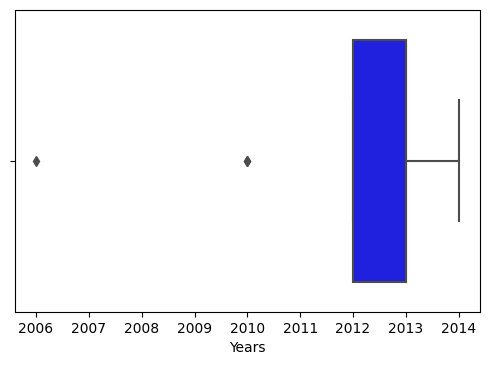

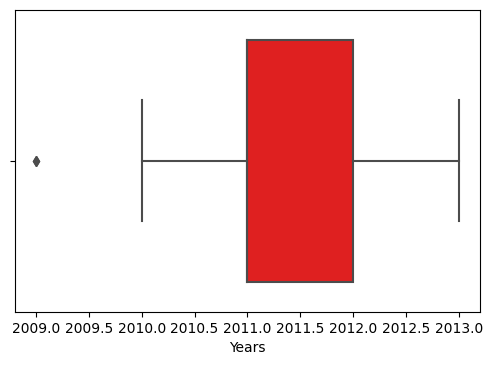

In [24]:
sns.boxplot(data= dete_resignations, x="cease_date", color="blue")
plt.xlabel("Years")
plt.show()

sns.boxplot(data= tafe_resignations, x="cease_date", color="red")
plt.xlabel("Years")
plt.show()

The year from both datasets, for cease_date and dete_start_date, seem to be pretty normal.

We even plot a boxplot, but it didn't show major issues with the values.

In [25]:
dete_resignations["institute_service"] = dete_resignations["cease_date"] - dete_resignations["dete_start_date"]

Since for our goal we need to know if the employee was for a short or long time working, we just created a new column in dete_resignations that will have that value. Just as the institute_service in the fate_resignations dataset.

In [26]:
tafe_resignations[["contributing_factors_dissatisfaction", "contributing_factors_job_dissatisfaction"]].apply(pd.value_counts)

,contributing_factors_dissatisfaction,contributing_factors_job_dissatisfaction
-,277.0,270.0
Contributing Factors. Dissatisfaction,55.0,NaN
Job Dissatisfaction,NaN,62.0


In [27]:
def update_vals(value):
    if pd.isnull(value):
        return np.nan
    elif value == "-":
        return False
    else:
        return True

In [28]:
tafe_resignations[["contributing_factors_dissatisfaction", "contributing_factors_job_dissatisfaction"]] = tafe_resignations[["contributing_factors_dissatisfaction", "contributing_factors_job_dissatisfaction"]].applymap(update_vals)

In [29]:
tafe_resignations[["contributing_factors_dissatisfaction", "contributing_factors_job_dissatisfaction"]].apply(pd.value_counts)

,contributing_factors_dissatisfaction,contributing_factors_job_dissatisfaction
False,277,270
True,55,62


In [30]:
dete_resignations["dissatisfied"] = dete_resignations[["job_dissatisfaction", "dissatisfaction_with_the_department", "physical_work_environment", "lack_of_recognition", "lack_of_job_security", "work_location", "employment_conditions", "work_life_balance", "workload"]].any(axis=1, skipna=False).copy()
tafe_resignations["dissatisfied"] = tafe_resignations[["contributing_factors_dissatisfaction", "contributing_factors_job_dissatisfaction"]].any(axis=1, skipna=False).copy()

In [31]:
dete_resignations_up = dete_resignations.copy()
tafe_resignations_up = tafe_resignations.copy()

We just updated the content in tafe_resignations so the values incontributing_factors_dissatisfaction and contributing_factors_job_dissatisfaction now show just True or False.

With that we were able to use .any() to know if the resign of each employee was related to a dissatisfaction, and we saved the result in a new column called "dissatisfied" that is on both datasets.

In [32]:
dete_resignations_up["institute"] = "DETE"
tafe_resignations_up["institute"] = "TAFE"

In [33]:
combined = pd.concat([dete_resignations_up, tafe_resignations_up], ignore_index=True)

In [34]:
combined

,id,separationtype,cease_date,dete_start_date,role_start_date,position,classification,region,business_unit,employment_status,career_move_to_public_sector,career_move_to_private_sector,interpersonal_conflicts,job_dissatisfaction,dissatisfaction_with_the_department,physical_work_environment,lack_of_recognition,lack_of_job_security,work_location,employment_conditions,maternity/family,relocation,study/travel,ill_health,traumatic_incident,work_life_balance,workload,none_of_the_above,gender,age,aboriginal,torres_strait,south_sea,disability,nesb,institute_service,dissatisfied,institute,workarea,contributing_factors_career_move_-_public_sector,contributing_factors_career_move_-_private_sector,contributing_factors_career_move_-_self-employment,contributing_factors_ill_health,contributing_factors_maternity/family,contributing_factors_dissatisfaction,contributing_factors_job_dissatisfaction,contributing_factors_interpersonal_conflict,contributing_factors_study,contributing_factors_travel,contributing_factors_other,contributing_factors_none,main_factor_which_of_these_was_the_main_factor_for_leaving?,instituteviews_topic:1_i_feel_the_senior_leadership_had_a_clear_vision_and_direction,instituteviews_topic:2_i_was_given_access_to_skills_training_to_help_me_do_my_job_better,instituteviews_topic:3_i_was_given_adequate_opportunities_for_personal_development,instituteviews_topic:4_i_was_given_adequate_opportunities_for_promotion_within_%institute]q25lbl%,instituteviews_topic:5_i_felt_the_salary_for_the_job_was_right_for_the_responsibilities_i_had,instituteviews_topic:6_the_organisation_recognised_when_staff_did_good_work,instituteviews_topic:7_management_was_generally_supportive_of_me,instituteviews_topic:8_management_was_generally_supportive_of_my_team,instituteviews_topic:9_i_was_kept_informed_of_the_changes_in_the_organisation_which_would_affect_me,instituteviews_topic:10_staff_morale_was_positive_within_the_institute,instituteviews_topic:11_if_i_had_a_workplace_issue_it_was_dealt_with_quickly,instituteviews_topic:12_if_i_had_a_workplace_issue_it_was_dealt_with_efficiently,instituteviews_topic:13_if_i_had_a_workplace_issue_it_was_dealt_with_discreetly,workunitviews_topic:14_i_was_satisfied_with_the_quality_of_the_management_and_supervision_within_my_work_unit,workunitviews_topic:15_i_worked_well_with_my_colleagues,workunitviews_topic:16_my_job_was_challenging_and_interesting,workunitviews_topic:17_i_was_encouraged_to_use_my_initiative_in_the_course_of_my_work,workunitviews_topic:18_i_had_sufficient_contact_with_other_people_in_my_job,workunitviews_topic:19_i_was_given_adequate_support_and_co-operation_by_my_peers_to_enable_me_to_do_my_job,workunitviews_topic:20_i_was_able_to_use_the_full_range_of_my_skills_in_my_job,workunitviews_topic:21_i_was_able_to_use_the_full_range_of_my_abilities_in_my_job_;_category:level_of_agreement;_question:your_views_about_your_work_unit],workunitviews_topic:22_i_was_able_to_use_the_full_range_of_my_knowledge_in_my_job,workunitviews_topic:23_my_job_provided_sufficient_variety,workunitviews_topic:24_i_was_able_to_cope_with_the_level_of_stress_and_pressure_in_my_job,workunitviews_topic:25_my_job_allowed_me_to_balance_the_demands_of_work_and_family_to_my_satisfaction,workunitviews_topic:26_my_supervisor_gave_me_adequate_personal_recognition_and_feedback_on_my_performance,"workunitviews_topic:27_my_working_environment_was_satisfactory_eg_sufficient_space,_good_lighting,_suitable_seating_and_working_area",workunitviews_topic:28_i_was_given_the_opportunity_to_mentor_and_coach_others_in_order_for_me_to_pass_on_my_skills_and_knowledge_prior_to_my_cessation_date,workunitviews_topic:29_there_was_adequate_communication_between_staff_in_my_unit,workunitviews_topic:30_staff_morale_was_positive_within_my_work_unit,induction_did_you_undertake_workplace_induction?,inductioninfo_topic:did_you_undertake_a_corporate_induction?,inductioninfo_topic:did_you_undertake_a_institute_induction?,inductioninfo_topic:_did_you_undertake_team_i

In [35]:
combined_updated = combined.dropna(thresh=500, axis=1).copy()

In [36]:
combined_updated

,id,separationtype,cease_date,position,employment_status,gender,age,institute_service,dissatisfied,institute
0,4.000000e+00,Resignation-Other reasons,2012.0,Teacher,Permanent Full-time,Female,36-40,7,False,DETE
1,6.000000e+00,Resignation-Other reasons,2012.0,Guidance Officer,Permanent Full-time,Female,41-45,18,True,DETE
2,9.000000e+00,Resignation-Other reasons,2012.0,Teacher,Permanent Full-time,Female,31-35,3,False,DETE
3,1.000000e+01,Resignation-Other employer,2012.0,Teacher Aide,Permanent Part-time,Female,46-50,15,True,DETE
4,1.200000e+01,Resignation-Move overseas/interstate,2012.0,Teacher,Permanent Full-time,Male,31-35,3,False,DETE
5,1.300000e+01,Resignation-Other reasons,2012.0,Teacher,Permanent Full-time,Female,36-40,14,False,DETE
6,1.500000e+01,Resignation-Other employer,2012.0,Teacher,Permanent Full-time,Male,31-35,5,True,DETE
7,1.700000e+01,Resignation-Other reasons,2012.0,Teacher Aide,Permanent Part-time,Male,61 or older,NaN,True,DETE
8,2.100000e+01,Resignation-Other employer,2012.0,Teacher,Permanent Full-time,Male,56-60,30,False,DETE
9,2.200000e+01,Resignation-Other reasons,2012.0,Cleaner,Permanent Part-time,Female,51-55,32,False,DETE


Now that we had the column showing if there was dissatisfaction at the moment of the resign, and also that we updated the name of the columns of both datasets to match if they had the same type of information, we can proceed and combine both datasets using pd.concat.  But before that we created a new column on each dataset to know to which institution is each data once they are combined.

In [37]:
combined_updated["institute_service"]

0                       7
1                      18
2                       3
3                      15
4                       3
5                      14
6                       5
7                     NaN
8                      30
9                      32
10                     15
11                     39
12                     17
13                      7
14                      9
15                      6
16                      1
17                    NaN
18                     35
19                     38
20                      1
21                     36
22                      3
23                      3
24                     19
25                      4
26                      9
27                      1
28                      6
29                      1
30                      5
31                     26
32                     10
33                      1
34                      6
35                     10
36                      8
37                    NaN
38          

In [38]:
combined_updated["institute_service"] = combined_updated["institute_service"].astype(str)

In [39]:
combined_updated.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 651 entries, 0 to 650
Data columns (total 10 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   id                 651 non-null    float64
 1   separationtype     651 non-null    object 
 2   cease_date         635 non-null    float64
 3   position           598 non-null    object 
 4   employment_status  597 non-null    object 
 5   gender             592 non-null    object 
 6   age                596 non-null    object 
 7   institute_service  651 non-null    object 
 8   dissatisfied       643 non-null    object 
 9   institute          651 non-null    object 
dtypes: float64(2), object(8)
memory usage: 51.0+ KB


In [40]:
combined_updated["institute_service"]

0                     7.0
1                    18.0
2                     3.0
3                    15.0
4                     3.0
5                    14.0
6                     5.0
7                     nan
8                    30.0
9                    32.0
10                   15.0
11                   39.0
12                   17.0
13                    7.0
14                    9.0
15                    6.0
16                    1.0
17                    nan
18                   35.0
19                   38.0
20                    1.0
21                   36.0
22                    3.0
23                    3.0
24                   19.0
25                    4.0
26                    9.0
27                    1.0
28                    6.0
29                    1.0
30                    5.0
31                   26.0
32                   10.0
33                    1.0
34                    6.0
35                   10.0
36                    8.0
37                    nan
38          

In [41]:
#Extracted the years using extractall
years_of_service = combined_updated["institute_service"].str.extractall(r"(?P<Years>[0-9\.]+)")

In [42]:
#Extracted the years using findall
#years_of_service = combined_updated["institute_service"].str.findall(r"(?P<Years>[0-9\.]+)")

In [43]:
years_of_service = years_of_service.astype(float)
years_of_service = years_of_service.groupby(level=0).mean()

In [44]:
years_of_service

,Years
0,7.0
1,18.0
2,3.0
3,15.0
4,3.0
5,14.0
6,5.0
8,30.0
9,32.0
10,15.0


In [45]:
combined_updated["institute_service"] = years_of_service
combined_updated

,id,separationtype,cease_date,position,employment_status,gender,age,institute_service,dissatisfied,institute
0,4.000000e+00,Resignation-Other reasons,2012.0,Teacher,Permanent Full-time,Female,36-40,7.0,False,DETE
1,6.000000e+00,Resignation-Other reasons,2012.0,Guidance Officer,Permanent Full-time,Female,41-45,18.0,True,DETE
2,9.000000e+00,Resignation-Other reasons,2012.0,Teacher,Permanent Full-time,Female,31-35,3.0,False,DETE
3,1.000000e+01,Resignation-Other employer,2012.0,Teacher Aide,Permanent Part-time,Female,46-50,15.0,True,DETE
4,1.200000e+01,Resignation-Move overseas/interstate,2012.0,Teacher,Permanent Full-time,Male,31-35,3.0,False,DETE
5,1.300000e+01,Resignation-Other reasons,2012.0,Teacher,Permanent Full-time,Female,36-40,14.0,False,DETE
6,1.500000e+01,Resignation-Other employer,2012.0,Teacher,Permanent Full-time,Male,31-35,5.0,True,DETE
7,1.700000e+01,Resignation-Other reasons,2012.0,Teacher Aide,Permanent Part-time,Male,61 or older,NaN,True,DETE
8,2.100000e+01,Resignation-Other employer,2012.0,Teacher,Permanent Full-time,Male,56-60,30.0,False,DETE
9,2.200000e+01,Resignation-Other reasons,2012.0,Cleaner,Permanent Part-time,Female,51-55,32.0,False,DETE


Since the column for "institute_service" that have the data for the ammount of time the employee worked in the institution have no standard, we decided to extract the years and in case there was a range, we obtained the mean of that range and assigned it as the new data for "institute_service".

In [46]:
def years_category(time):
    if pd.isnull(time):
        return np.nan
    elif time < 3:
        return "New"
    elif 3 <= time <= 6:
        return "Experienced"
    elif 7 <= time <= 10:
        return "Established"
    elif time >= 11:
        return "Veteran"

In [47]:
combined_updated["service_cat"] = combined_updated["institute_service"].apply(years_category)
combined_updated

,id,separationtype,cease_date,position,employment_status,gender,age,institute_service,dissatisfied,institute,service_cat
0,4.000000e+00,Resignation-Other reasons,2012.0,Teacher,Permanent Full-time,Female,36-40,7.0,False,DETE,Established
1,6.000000e+00,Resignation-Other reasons,2012.0,Guidance Officer,Permanent Full-time,Female,41-45,18.0,True,DETE,Veteran
2,9.000000e+00,Resignation-Other reasons,2012.0,Teacher,Permanent Full-time,Female,31-35,3.0,False,DETE,Experienced
3,1.000000e+01,Resignation-Other employer,2012.0,Teacher Aide,Permanent Part-time,Female,46-50,15.0,True,DETE,Veteran
4,1.200000e+01,Resignation-Move overseas/interstate,2012.0,Teacher,Permanent Full-time,Male,31-35,3.0,False,DETE,Experienced
5,1.300000e+01,Resignation-Other reasons,2012.0,Teacher,Permanent Full-time,Female,36-40,14.0,False,DETE,Veteran
6,1.500000e+01,Resignation-Other employer,2012.0,Teacher,Permanent Full-time,Male,31-35,5.0,True,DETE,Experienced
7,1.700000e+01,Resignation-Other reasons,2012.0,Teacher Aide,Permanent Part-time,Male,61 or older,NaN,True,DETE,NaN
8,2.100000e+01,Resignation-Other employer,2012.0,Teacher,Permanent Full-time,Male,56-60,30.0,False,DETE,Veteran
9,2.200000e+01,Resignation-Other reasons,2012.0,Cleaner,Permanent Part-time,Female,51-55,32.0,False,DETE,Veteran


Now that we had the "institute_service" column standarized, we are able to create a new column and use an ordinal representation of the ammount of years an employee worked in the institution.

In [48]:
combined_updated["dissatisfied"].value_counts(dropna=False)

False    403
True     240
NaN        8
Name: dissatisfied, dtype: int64

In [49]:
combined_updated["dissatisfied"] = combined_updated["dissatisfied"].fillna(False)

In [50]:
dissatisfaction_per_cat = round(combined_updated.pivot_table(values="dissatisfied", index="service_cat"), 2).iloc[[2, 1, 0, 3]]
dissatisfaction_per_cat

,dissatisfied
service_cat,
New,0.30
Experienced,0.34
Established,0.52
Veteran,0.49


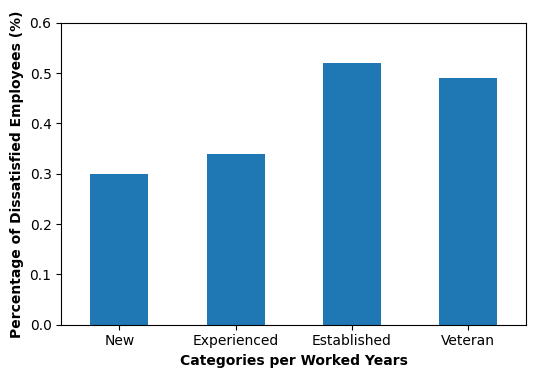

In [51]:
dissatisfaction_per_cat.plot(kind="bar", y="dissatisfied", rot=0, ylim=(0, 0.6), legend=False)
plt.xlabel("Categories per Worked Years", weight="bold")
plt.ylabel("Percentage of Dissatisfied Employees (%)", weight="bold")
plt.show()

With the values in the column "dissatisfied" we were able to obtain the percentage of employees that ressigned because of dissatisfaction, and used that information to plot a barplot to show the results.

Seems that the category of employees with higher ressigns because of dissatisfaction was the "Established", that are the employees with 7-10 years worked in the institution, followed by the "Veteran" category, that were the employees with 11 or more years worked in the institution.